In [1]:
!pip install pykonal
#!pip install "numpy<2.0"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.6/10.6 MB 6.7 MB/s  0:00:01 eta 0:00:0136m0:00:01m
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached cython-3.2.4-cp314-cp314-manylinux2014_x86_64.manylinux_2_17_x86_64.manylinux_2_28_x86_64.whl.metadata (7.5 kB)
Using cached cython-3.2.4-cp314-cp314-manylinux2014_x86_64.manylinux_2_17_x86_64.manylinux_2_28_x86_64.whl (3.4 MB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 25.5 MB/s  0:00:00
  Created wheel for pykonal: filename=pykonal-0.4.1-cp314-cp314-linux_x86_64.whl size=11487172 sha256=4eddc9e21971ee4d9be4b044e1140f51079586dbd28bb1aa72b1ac8f1fcbc3b7
  Stored in directory: /home/users/exet5760/.cache/pip/wheels/aa/b4/df/c8db55b09c97e2c7fc251dc0117d105b82f83b8d38bf09197f
Successfully built pykonal
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3/3 [pykonal]━━━━━━━━━━ 2/3 [pykonal]


In [2]:
import numpy as np
import pykonal
import matplotlib.pyplot as plt


# --- Safety patch for NumPy >= 2.0 ---
if not hasattr(np, "infty"):
    np.infty = np.inf

# 1) Initialize solver (Cartesian coordinates)
solver = pykonal.EikonalSolver(coord_sys="cartesian")

# 2) Define grid geometry
solver.velocity.min_coords = (0.0, 0.0, 0.0)       # origin (x0, y0, z0)
solver.velocity.node_intervals = (1.0, 1.0, 1.0)   # dx, dy, dz
solver.velocity.npts = (10, 10, 10)                # nx, ny, nz

# 3) Define velocity field
nx, ny, nz = solver.velocity.npts
vel = np.empty((nx, ny, nz))

# first layer (z index = 0)
vel[:, :, 0] = 5.5
# all other layers (z = 1..9)
vel[:, :, 1:] = 5.76

solver.velocity.values = vel

# --- optional: verify ---
print("Velocity model shape:", vel.shape)
print("Top layer velocity:", vel[0,0,0])
print("Second layer velocity:", vel[0,0,1])

# 4) Define a source on the top layer
src_idx = (5, 5, 9)
solver.traveltime.values[src_idx] = 0.0
solver.unknown[src_idx] = False
solver.trial.push(*src_idx)

# 5) Solve travel times
solver.solve()

# --- optional check: travel time at some point ---
end_idx = (9, 9, 0)
tt = solver.traveltime.values[end_idx]
print(f"Travel time to node {end_idx}: {tt:.3f} s")

# --- optional: ray tracing (ensure NumPy patch above) ---
end_coord = np.array([9.0, 9.0, 0])
ray = solver.trace_ray(end_coord)
print("Ray path shape:", ray.shape)



Velocity model shape: (10, 10, 10)
Top layer velocity: 5.5
Second layer velocity: 5.76
Travel time to node (9, 9, 0): 1.940 s
Ray path shape: (43, 3)


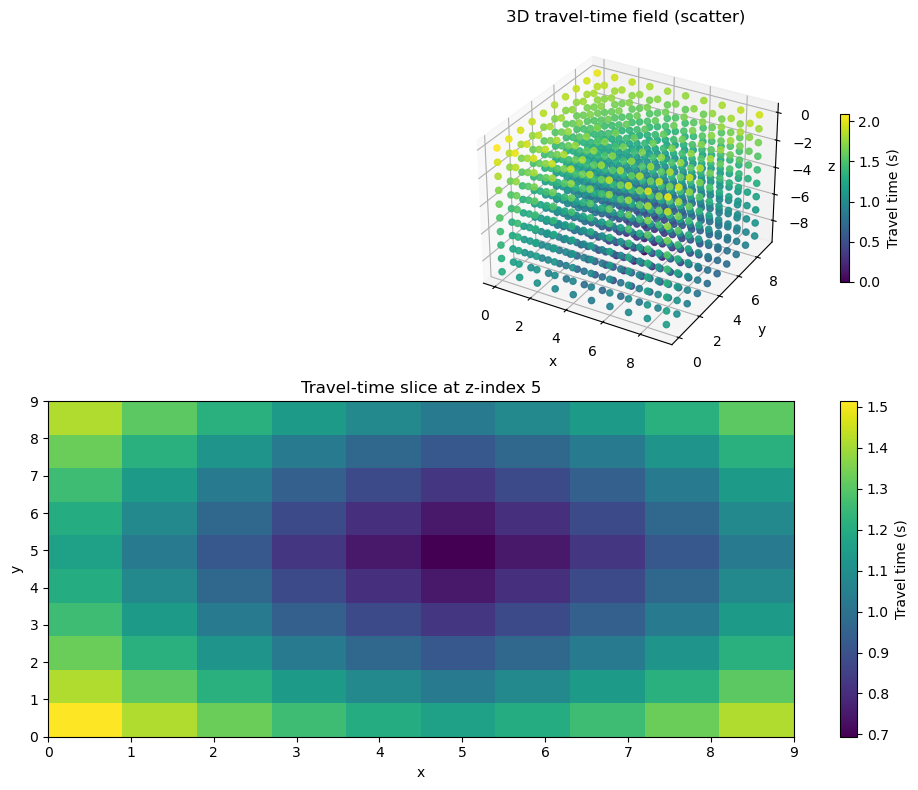

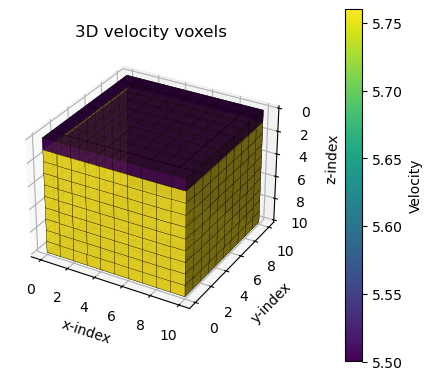

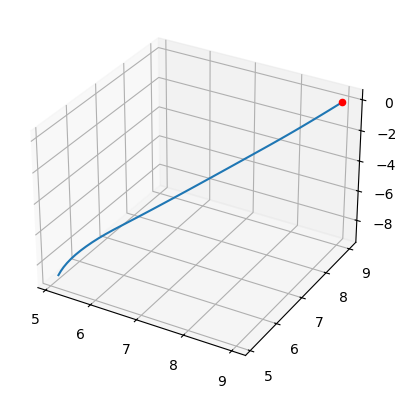

In [3]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401
from matplotlib import cm

# --- prepare coordinates and fields ---
min_x, min_y, min_z = solver.velocity.min_coords
dx, dy, dz = solver.velocity.node_intervals
nx, ny, nz = solver.velocity.npts

# Create coordinate arrays (grid centers at integer node indices times interval)
xs = min_x + np.arange(nx) * dx
ys = min_y + np.arange(ny) * dy
zs = min_z + np.arange(nz) * dz
X, Y, Z = np.meshgrid(xs, ys, zs, indexing='ij')  # shape (nx,ny,nz)

# Flatten for scatter plotting
coords = np.column_stack((X.ravel(), Y.ravel(), Z.ravel()))
tt_vals = solver.traveltime.values.ravel()
vel_vals = solver.velocity.values.ravel()

# ---------------------------
# 1) 3D scatter colored by travel time + 2D mid-slice of travel time
# ---------------------------
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(211, projection='3d')  # top: 3D scatter

sc = ax.scatter(coords[:, 0], coords[:, 1], -coords[:, 2],
                c=tt_vals, cmap='viridis', s=20, alpha=0.9)
ax.set_title('3D travel-time field (scatter)')
ax.set_xlabel('x'); ax.set_ylabel('y'); ax.set_zlabel('z')

# source and endpoint markers (if available)
try:
    ax.scatter([src_coord[0]], [src_coord[1]], [-src_coord[2]], c='k', s=60, label='source')
    ax.scatter([end_coord[0]], [end_coord[1]], [-end_coord[2]], c='r', s=60, label='end')
    ax.legend()
except NameError:
    pass

# colorbar for travel time
mappable_tt = cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=tt_vals.min(), vmax=tt_vals.max()))
mappable_tt.set_array(tt_vals)
fig.colorbar(mappable_tt, ax=ax, shrink=0.5, label='Travel time (s)')

# bottom: mid-z slice (2D image) for travel time
ax2 = fig.add_subplot(212)
mid_k = nz // 2
tt_slice = solver.traveltime.values[:, :, mid_k].T  # transpose so orientation matches x-y
im = ax2.imshow(tt_slice, origin='lower',
                extent=(xs.min(), xs.max(), ys.min(), ys.max()),
                aspect='auto')
ax2.set_title(f'Travel-time slice at z-index {mid_k}')
ax2.set_xlabel('x'); ax2.set_ylabel('y')
fig.colorbar(im, ax=ax2, label='Travel time (s)')
plt.tight_layout()
plt.show()

# ---------------------------
# 2) 3D voxel plot of velocity model + 2D mid-slice of velocity
# ---------------------------
# occupancy mask (show all voxels)
occupancy = np.ones((nx, ny, nz), dtype=bool)

# map velocities to facecolors via a cmap
vel_min, vel_max = solver.velocity.values.min(), solver.velocity.values.max()
norm_vel = plt.Normalize(vmin=vel_min, vmax=vel_max)
facecolors = cm.viridis(norm_vel(solver.velocity.values))

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(121, projection='3d')
ax.set_title('3D velocity voxels')

# matplotlib voxels expects boolean occupancy and facecolors shaped (nx,ny,nz,4)
ax.voxels(occupancy, facecolors=facecolors, edgecolor='k', linewidth=0.2, alpha=0.9)
ax.set_xlabel('x-index'); ax.set_ylabel('y-index'); ax.set_zlabel('z-index')

# colorbar for velocity (create a ScalarMappable)
mappable_v = cm.ScalarMappable(cmap='viridis', norm=norm_vel)
mappable_v.set_array(solver.velocity.values)
ax.invert_zaxis()

fig.colorbar(mappable_v, ax=ax, shrink=0.6, fraction=0.05, pad=0.15, label='Velocity')




try:
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.plot(ray[:, 0], ray[:, 1], -ray[:, 2], '-', label='ray')
    ax.scatter([end_coord[0]], [end_coord[1]], [-end_coord[2]], c='r', label='end')
    ax.scatter([src_coord[0]], [src_coord[1]], [-src_coord[2]], c='k', label='source')
    ax.set_xlabel('x'); ax.set_ylabel('y'); ax.set_zlabel('z'); ax.legend()
    plt.title('Ray path')
    plt.show()
except NameError:
    pass


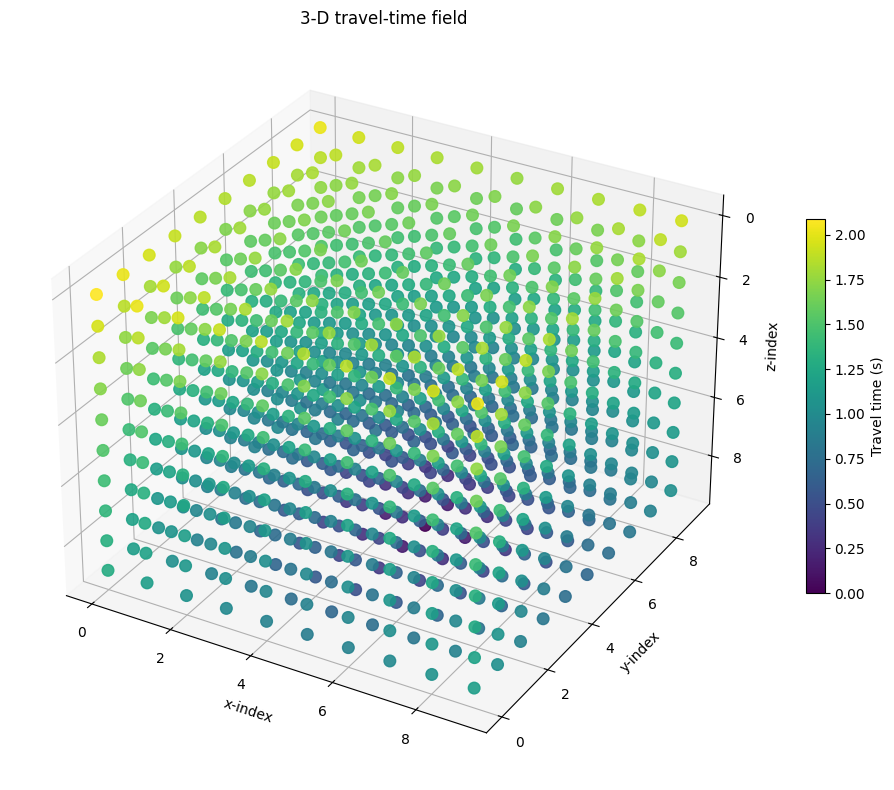

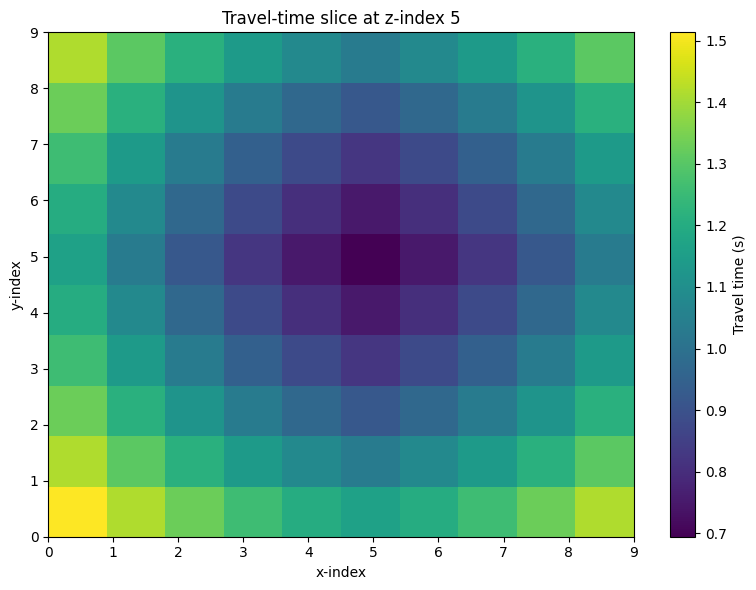

/tmp/ipython-input-100194031.py:77: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_discrete = cm.get_cmap('viridis', n_colors)


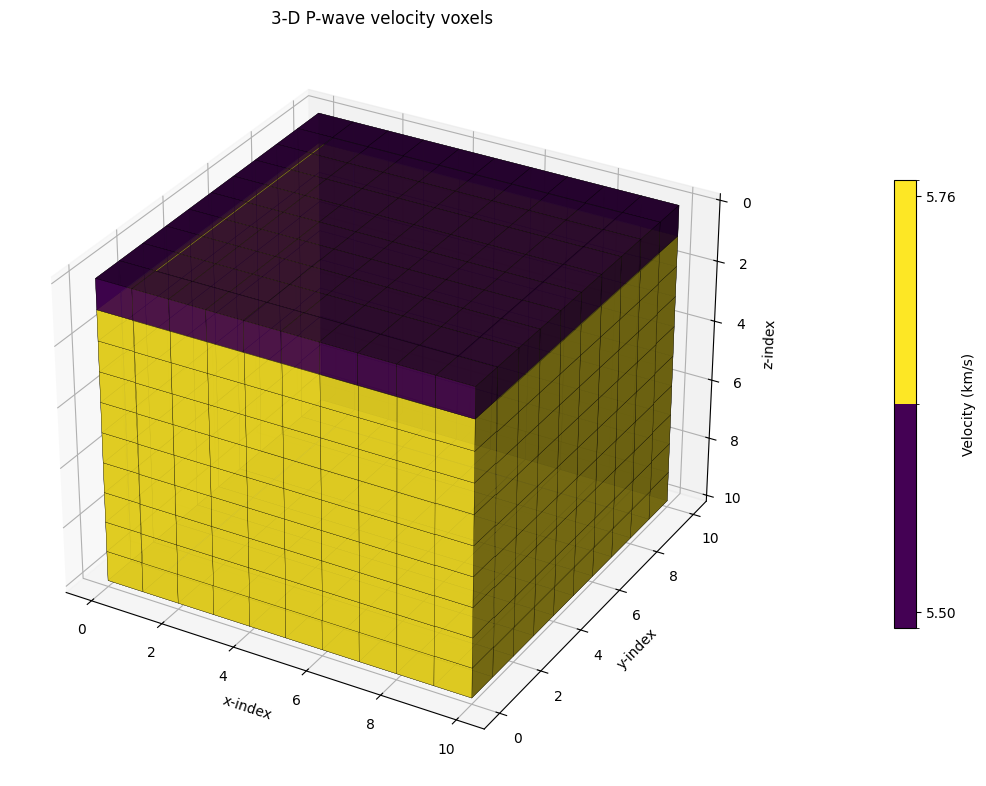

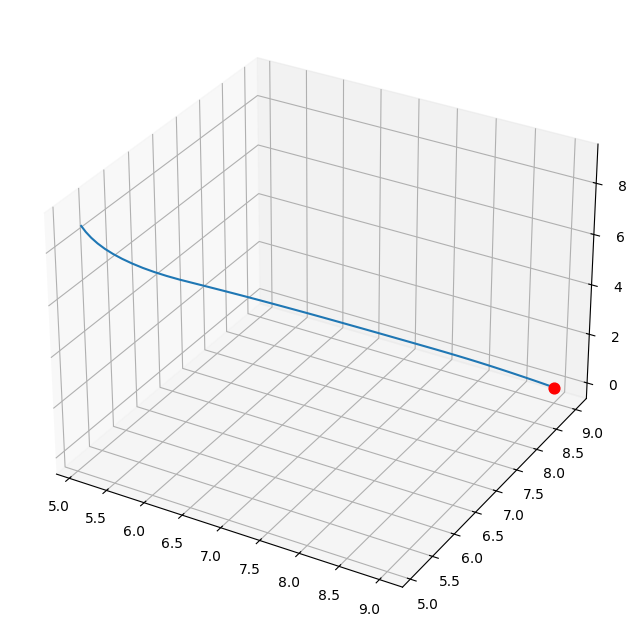

In [ ]:
# COPIED AND ALTERED FOR REPORT DIAGRAM
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401
from matplotlib import cm
from matplotlib.colors import BoundaryNorm

# --- prepare coordinates and fields ---
min_x, min_y, min_z = solver.velocity.min_coords
dx, dy, dz = solver.velocity.node_intervals
nx, ny, nz = solver.velocity.npts

# Create coordinate arrays (grid centers at integer node indices times interval)
xs = min_x + np.arange(nx) * dx
ys = min_y + np.arange(ny) * dy
zs = min_z + np.arange(nz) * dz
X, Y, Z = np.meshgrid(xs, ys, zs, indexing='ij')  # shape (nx,ny,nz)

# Flatten for scatter plotting
coords = np.column_stack((X.ravel(), Y.ravel(), Z.ravel()))
tt_vals = solver.traveltime.values.ravel()
vel_vals = solver.velocity.values.ravel()

# ---------------------------
# 1) 3D scatter colored by travel time
# ---------------------------
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

sc = ax.scatter(coords[:, 0], coords[:, 1], coords[:, 2],
                c=tt_vals, cmap='viridis', s=70, alpha=0.9)
ax.set_title('3-D travel-time field')
ax.set_xlabel('x-index'); ax.set_ylabel('y-index'); ax.set_zlabel('z-index')
ax.invert_zaxis()

# source and endpoint markers (if available)
try:
    ax.scatter([src_coord[0]], [src_coord[1]], [src_coord[2]], c='k', s=60, label='source')
    ax.scatter([end_coord[0]], [end_coord[1]], [end_coord[2]], c='r', s=60, label='end')
    ax.legend()
except NameError:
    pass

# colorbar for travel time
mappable_tt = cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=tt_vals.min(), vmax=tt_vals.max()))
mappable_tt.set_array(tt_vals)
fig.colorbar(mappable_tt, ax=ax, shrink=0.5, label='Travel time (s)')
plt.tight_layout()
plt.show()

# ---------------------------
# 2) 2D mid-slice of travel time
# ---------------------------
fig2 = plt.figure(figsize=(8, 6))
ax2 = fig2.add_subplot(111)
mid_k = nz // 2
tt_slice = solver.traveltime.values[:, :, mid_k].T  # transpose so orientation matches x-y
im = ax2.imshow(tt_slice, origin='lower',
                extent=(xs.min(), xs.max(), ys.min(), ys.max()),
                aspect='auto', cmap='viridis')
ax2.set_title(f'Travel-time slice at z-index {mid_k}')
ax2.set_xlabel('x-index'); ax2.set_ylabel('y-index')
fig2.colorbar(im, ax=ax2, label='Travel time (s)')
plt.tight_layout()
plt.show()

# ---------------------------
# 3) 3D voxel plot of velocity model
# ---------------------------
# occupancy mask (show all voxels)
occupancy = np.ones((nx, ny, nz), dtype=bool)

# Get unique velocity values for discrete colorbar
unique_vels = np.unique(solver.velocity.values)
n_colors = len(unique_vels)

# Create discrete colormap
cmap_discrete = cm.get_cmap('viridis', n_colors)
vel_min, vel_max = solver.velocity.values.min(), solver.velocity.values.max()

# Create BoundaryNorm for discrete colors
boundaries = np.concatenate([[vel_min - 0.01],
                             (unique_vels[:-1] + unique_vels[1:]) / 2,
                             [vel_max + 0.01]])
norm_vel = BoundaryNorm(boundaries, cmap_discrete.N)

facecolors = cmap_discrete(norm_vel(solver.velocity.values))

fig3 = plt.figure(figsize=(10, 8))
ax3 = fig3.add_subplot(111, projection='3d')
ax3.set_title('3-D P-wave velocity voxels')

# matplotlib voxels expects boolean occupancy and facecolors shaped (nx,ny,nz,4)
ax3.voxels(occupancy, facecolors=facecolors, edgecolor='k', linewidth=0.2, alpha=0.9)
ax3.set_xlabel('x-index'); ax3.set_ylabel('y-index'); ax3.set_zlabel('z-index')
ax3.invert_zaxis()

# colorbar for velocity with discrete levels
mappable_v = cm.ScalarMappable(cmap=cmap_discrete, norm=norm_vel)
mappable_v.set_array(solver.velocity.values)
cbar = fig3.colorbar(mappable_v, ax=ax3, shrink=0.6, fraction=0.05, pad=0.15, label='Velocity (km/s)')
cbar.set_ticks(unique_vels)
cbar.set_ticklabels([f'{v:.2f}' for v in unique_vels])

plt.tight_layout()
plt.show()

# ---------------------------
# 4) Ray path plot
# ---------------------------
try:
    fig4 = plt.figure(figsize=(10, 8))
    ax4 = fig4.add_subplot(111, projection='3d')
    ax4.plot(ray[:, 0], ray[:, 1], ray[:, 2], '-', label='ray')
    ax4.scatter([end_coord[0]], [end_coord[1]], [end_coord[2]], c='r', s=60, label='end')
    ax4.scatter([src_coord[0]], [src_coord[1]], [src_coord[2]], c='k', s=60, label='source')
    ax4.set_xlabel('x-index'); ax4.set_ylabel('y-index'); ax4.set_zlabel('z-index')
    ax4.invert_zaxis()
    ax4.legend()
    plt.title('Ray path')
    plt.tight_layout()
    plt.show()
except NameError:
    pass

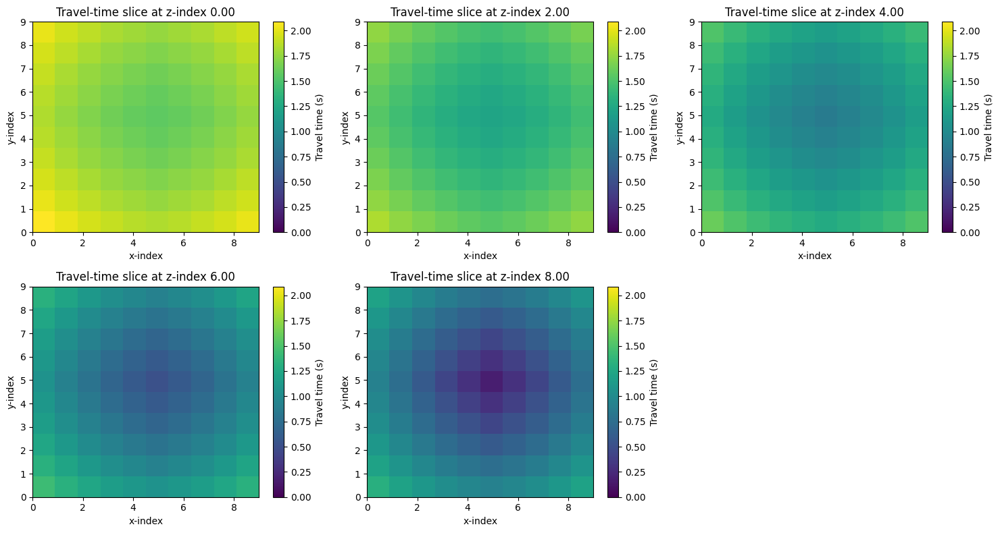

In [ ]:
# ---------------------------
# 2D travel time slices at multiple depths
# ---------------------------
fig_slices = plt.figure(figsize=(15, 8))

# Define the z-depths we want to slice at
z_depths = [0, 2, 4, 6, 8]  # km

# Set fixed colorbar limits
vmin = 0.0
vmax = solver.traveltime.values.max()

for i, z_depth in enumerate(z_depths):
    # Find the closest z-index to the desired depth
    z_idx = np.argmin(np.abs(zs - z_depth))
    actual_z = zs[z_idx]

    ax = fig_slices.add_subplot(2, 3, i+1)
    tt_slice = solver.traveltime.values[:, :, z_idx].T  # transpose so orientation matches x-y
    im = ax.imshow(tt_slice, origin='lower',
                    extent=(xs.min(), xs.max(), ys.min(), ys.max()),
                    aspect='auto', cmap='viridis', vmin=vmin, vmax=vmax)
    ax.set_title(f'Travel-time slice at z-index {actual_z:.2f}')
    ax.set_xlabel('x-index')
    ax.set_ylabel('y-index')
    fig_slices.colorbar(im, ax=ax, label='Travel time (s)')

plt.tight_layout()
plt.show()

In [6]:
"""
Robust ray tracing script for PyKonal.
Creates a new solver per source to avoid version-dependent reset issues.
"""

import os
import numpy as np
import pykonal
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401

# --- Compatibility patch for NumPy >= 2.0 (fixes PyKonal bug) ---
if not hasattr(np, "infty"):
    np.infty = np.inf

# ---------- Grid / velocity setup helper ----------
def build_solver():
    solver = pykonal.EikonalSolver(coord_sys="cartesian")

    # grid geometry
    solver.velocity.min_coords = (0.0, 0.0, 0.0)
    solver.velocity.node_intervals = (1.0, 1.0, 1.0)
    solver.velocity.npts = (10, 10, 10)

    # velocity model
    nx, ny, nz = solver.velocity.npts
    vel = np.empty((nx, ny, nz), dtype=float)
    vel[:, :, 0] = 5.5
    vel[:, :, 1:] = 5.76
    solver.velocity.values = vel

    return solver

# ---------- Utility: check point inside domain ----------
def point_inside_domain(pt, solver):
    minc = np.array(solver.velocity.min_coords, dtype=float)
    intervals = np.array(solver.velocity.node_intervals, dtype=float)
    npts = np.array(solver.velocity.npts, dtype=int)
    maxc = minc + (npts - 1) * intervals
    return np.all(pt >= minc - 1e-8) and np.all(pt <= maxc + 1e-8)

# ---------- Main tracing function (rebuild solver per source) ----------
def trace_rays(sources, receivers, out_dir="rays_output", pairwise_if_same_length=True):
    """
    For robustness across PyKonal versions we build a fresh solver for each source.
    """
    os.makedirs(out_dir, exist_ok=True)

    Ns = sources.shape[0]
    Nr = receivers.shape[0]

    if Ns == Nr and pairwise_if_same_length:
        pairs = [(i, i) for i in range(Ns)]
        info_text = f"Pairwise mode (Ns==Nr=={Ns})"
    else:
        pairs = [(i, j) for i in range(Ns) for j in range(Nr)]
        info_text = f"All-pairs mode (Ns={Ns}, Nr={Nr}, total_pairs={len(pairs)})"

    print(f"[trace_rays] {info_text}")

    all_rays = []
    failed = []

    # We'll build a prototype solver only to get domain info (min_coords, intervals, npts)
    proto = build_solver()
    min_coords = np.array(proto.velocity.min_coords)
    intervals = np.array(proto.velocity.node_intervals)
    npts = proto.velocity.npts

    for src_i, rec_j in pairs:
        src = np.asarray(sources[src_i], dtype=float)
        rec = np.asarray(receivers[rec_j], dtype=float)

        # bounds check (using prototype solver)
        if not point_inside_domain(src, proto):
            msg = f"Source {src_i} at {src} is outside domain; skipping."
            print(msg)
            failed.append(("src", src_i, rec_j, msg))
            continue
        if not point_inside_domain(rec, proto):
            msg = f"Receiver {rec_j} at {rec} is outside domain; skipping."
            print(msg)
            failed.append(("rec", src_i, rec_j, msg))
            continue

        # build fresh solver for this source
        solver = build_solver()

        # choose nearest grid node for the source
        rel = (src - min_coords) / intervals
        src_idx = tuple(np.round(rel).astype(int).tolist())
        src_idx = (
            max(0, min(npts[0] - 1, src_idx[0])),
            max(0, min(npts[1] - 1, src_idx[1])),
            max(0, min(npts[2] - 1, src_idx[2])),
        )

        # initialize source node
        try:
            solver.traveltime.values[src_idx] = 0.0
        except Exception as e:
            msg = f"Failed to set traveltime.values at {src_idx}: {e}"
            print(msg)
            failed.append(("init_tt", src_i, rec_j, msg))
            continue


        pushed = False
        try:
            # preferred approach if solver exposes 'unknown' at top-level
            solver.unknown[src_idx] = False
            try:
                solver.trial.push(*src_idx)
                pushed = True
            except Exception:
                pass
        except Exception:
            # fallback to traveltime flags
            try:
                solver.traveltime.known[src_idx] = True
                solver.traveltime.unknown[src_idx] = False
                try:
                    solver.traveltime.trial.push(*src_idx)
                    pushed = True
                except Exception:
                    pass
            except Exception:
                # last-ditch: try pushing to solver.trial if exists
                try:
                    solver.trial.push(*src_idx)
                    pushed = True
                except Exception:

                    pushed = False

        # solve the eikonal
        try:
            solver.solve()
        except Exception as e:
            msg = f"Solver failed for source {src_i} (idx={src_idx}): {e}"
            print(msg)
            failed.append(("solve", src_i, rec_j, msg))
            continue

        # trace ray from receiver back to source
        try:
            ray = solver.trace_ray(rec)
            if ray is None or len(ray) == 0:
                raise RuntimeError("trace_ray returned empty path")
        except Exception as e:
            msg = f"trace_ray failed for src {src_i} -> rec {rec_j}: {e}"
            print(msg)
            failed.append(("trace", src_i, rec_j, msg))
            continue

        # save ray
        fname = os.path.join(out_dir, f"ray_src{src_i}_rec{rec_j}.npy")
        np.save(fname, ray)
        print(f"Saved ray for src{src_i}->rec{rec_j} to {fname}; path length {len(ray)}")
        all_rays.append((src_i, rec_j, ray))

    print(f"[trace_rays] Done. rays_saved={len(all_rays)}, failures={len(failed)}")
    return all_rays, failed

# ---------- Example usage block ----------
if __name__ == "__main__":
    sources = np.load("./DATA_Cornwall/cartesian_src_SOLA.npy")      # shape (Ns,3)
    receivers = np.load("./DATA_Cornwall/cartesian_rec_SOLA.npy")  # shape (Nr,3)

    if sources.ndim != 2 or sources.shape[1] != 3:
        raise ValueError("sources.npy should be shape (Ns,3)")
    if receivers.ndim != 2 or receivers.shape[1] != 3:
        raise ValueError("receivers.npy should be shape (Nr,3)")

    rays, failures = trace_rays(sources, receivers, out_dir="rays_output")

"""
    # plotting (same as before)
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection="3d")
    for (s_i, r_j, ray) in rays:
        ax.plot(ray[:, 0], ray[:, 1], ray[:, 2], linewidth=1.5, label=f"s{s_i}-r{r_j}")
        ax.scatter([ray[0, 0]], [ray[0, 1]], [ray[0, 2]], marker="o", s=30)
        ax.scatter([ray[-1, 0]], [ray[-1, 1]], [ray[-1, 2]], marker="^", s=40)

    ax.set_xlabel("X"); ax.set_ylabel("Y"); ax.set_zlabel("Z")
    ax.set_title("Traced rays (receiver -> source)")
    if len(rays) <= 20:
        ax.legend()
    plt.tight_layout()
    plt.show()

    if failures:
        print("\nFailures:")
        for f in failures:
            print(f)
"""

[trace_rays] All-pairs mode (Ns=242, Nr=179, total_pairs=43318)
Saved ray for src0->rec0 to rays_output/ray_src0_rec0.npy; path length 23
Saved ray for src0->rec1 to rays_output/ray_src0_rec1.npy; path length 22
Saved ray for src0->rec2 to rays_output/ray_src0_rec2.npy; path length 23
Saved ray for src0->rec3 to rays_output/ray_src0_rec3.npy; path length 21
Saved ray for src0->rec4 to rays_output/ray_src0_rec4.npy; path length 21
Saved ray for src0->rec5 to rays_output/ray_src0_rec5.npy; path length 20
Saved ray for src0->rec6 to rays_output/ray_src0_rec6.npy; path length 20
Saved ray for src0->rec7 to rays_output/ray_src0_rec7.npy; path length 20
Saved ray for src0->rec8 to rays_output/ray_src0_rec8.npy; path length 19
Saved ray for src0->rec9 to rays_output/ray_src0_rec9.npy; path length 20
Saved ray for src0->rec10 to rays_output/ray_src0_rec10.npy; path length 21
Saved ray for src0->rec11 to rays_output/ray_src0_rec11.npy; path length 21
Saved ray for src0->rec12 to rays_output/ray

'\n    # plotting (same as before)\n    fig = plt.figure(figsize=(10, 8))\n    ax = fig.add_subplot(111, projection="3d")\n    for (s_i, r_j, ray) in rays:\n        ax.plot(ray[:, 0], ray[:, 1], ray[:, 2], linewidth=1.5, label=f"s{s_i}-r{r_j}")\n        ax.scatter([ray[0, 0]], [ray[0, 1]], [ray[0, 2]], marker="o", s=30)\n        ax.scatter([ray[-1, 0]], [ray[-1, 1]], [ray[-1, 2]], marker="^", s=40)\n\n    ax.set_xlabel("X"); ax.set_ylabel("Y"); ax.set_zlabel("Z")\n    ax.set_title("Traced rays (receiver -> source)")\n    if len(rays) <= 20:\n        ax.legend()\n    plt.tight_layout()\n    plt.show()\n\n    if failures:\n        print("\nFailures:")\n        for f in failures:\n            print(f)\n'

In [8]:
import os
import numpy as np
import pandas as pd
import csv
import pykonal
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401

# ---- Compatibility patch for NumPy >= 2.0 (pykonal uses np.infty in some versions) ----
if not hasattr(np, "infty"):
    np.infty = np.inf

# -------------------- Parsing utilities --------------------
def parse_dat_file(dat_path):
    """
    Parse the .dat file format you showed.
    Returns: dict mapping source_id -> list of records
    each record: {'station': str, 'tt': float, 'weight': float, 'phase': 'P'/'S'}
    """
    sources = {}
    current_source = None
    with open(dat_path, "r") as f:
        for raw in f:
            line = raw.strip()
            if not line:
                continue
            if line.startswith("#"):
                # header line; take last token as source id (strip '#')
                tokens = line[1:].strip().split()
                if len(tokens) == 0:
                    continue
                current_source = tokens[-1]
                if current_source not in sources:
                    sources[current_source] = []
                continue

            # parse entry lines like: NAME   0.70   1.00  P
            parts = line.split()
            if len(parts) < 4:
                # skip malformed lines
                continue
            station = parts[0]
            try:
                tt = float(parts[1])
            except Exception:
                tt = np.nan
            try:
                weight = float(parts[2])
            except Exception:
                weight = np.nan
            phase = parts[3].upper()
            if current_source is None:
                # if file starts without header, skip
                continue
            sources[current_source].append({"station": station, "tt": tt, "weight": weight, "phase": phase})
    return sources

# -------------------- Station/source coordinate loaders --------------------
def load_station_coords_csv(station_csv):
    """
    station_csv: CSV with header: name,x,y,z  (z optional; if missing, z=0)
    Returns dict: name -> np.array([x,y,z])
    """
    coords = {}
    with open(station_csv, newline="") as csvfile:
        rdr = csv.DictReader(csvfile)
        for row in rdr:
            name = row.get("name") or row.get("station") or row.get("sta") or row.get("s")
            if name is None:
                continue
            x = float(row.get("x_m"))/1000
            y = float(row.get("y_m"))/1000
            z = float(row.get("elev"))/1000
            coords[name] = np.array([x, y, z], dtype=float)
    return coords

def load_source_coords_csv(source_csv):
    """
    Read events / sources CSV and return dict mapping source_id (string) -> np.array([x_km, y_km, z_km]).
    Handles common column names: 'name','id','event','event_id'. Accepts whitespace-delimited files.
    Converts x_m,y_m,elev from meters -> kilometers (divide by 1000).
    """
    import pandas as pd
    coords = {}

    # read with whitespace delimiting (your sample file looks whitespace-separated)
    df = pd.read_csv(source_csv, delim_whitespace=True, dtype=str)
    # strip whitespace from column names
    df.columns = df.columns.str.strip()

    # normalize column names to lower-case for detection
    cols_lower = {c.lower(): c for c in df.columns}

    # try to find id column
    id_col = None
    for candidate in ("name", "id", "event", "event_id", "name_id"):
        if candidate in cols_lower:
            id_col = cols_lower[candidate]
            break
    # fallback: if 'date'+'time' pair could be used as unique id, create one
    if id_col is None:
        # if there's a 'name' like column with numeric labels, pandas may have parsed it differently.
        # fall back to using the row index as ID (string)
        df["__generated_id__"] = df.index.astype(str)
        id_col = "__generated_id__"

    # try to find coordinate columns
    x_col = cols_lower.get("x_m") or cols_lower.get("x") or next((c for c in df.columns if c.lower().startswith("x")), None)
    y_col = cols_lower.get("y_m") or cols_lower.get("y") or next((c for c in df.columns if c.lower().startswith("y")), None)
    z_col = cols_lower.get("elev") or cols_lower.get("z") or cols_lower.get("depth") or next((c for c in df.columns if c.lower().startswith("e")), None)

    if x_col is None or y_col is None:
        raise ValueError(f"Could not detect x/y columns in {source_csv}. Found columns: {list(df.columns)}")

    # coerce numeric columns (safe conversion), fill or raise if not convertible
    df[x_col] = pd.to_numeric(df[x_col], errors="coerce")
    df[y_col] = pd.to_numeric(df[y_col], errors="coerce")
    if z_col is not None:
        df[z_col] = pd.to_numeric(df[z_col], errors="coerce")
    else:
        # if no z/elev, create zeros
        df["__z__"] = 0.0
        z_col = "__z__"

    # convert meters -> kilometers consistently
    df[x_col] = df[x_col] / 1000.0
    df[y_col] = df[y_col] / 1000.0
    df[z_col] = df[z_col]

    # build dict mapping string ids to np.array coords
    for _, row in df.iterrows():
        raw_id = row[id_col]
        if pd.isna(raw_id):
            continue
        src_id = str(raw_id).strip()
        if pd.isna(row[x_col]) or pd.isna(row[y_col]) or pd.isna(row[z_col]):
            # skip or warn if coordinate missing
            print(f"[WARN] skipping source {src_id} because of missing coordinates")
            continue
        coords[src_id] = np.array([row[x_col], row[y_col], row[z_col]], dtype=float)

    # helpful debug print
    print(f"[INFO] Loaded {len(coords)} source coords from {source_csv} (id column: '{id_col}', x/y/z: '{x_col}/{y_col}/{z_col}')")
    # optionally show a few keys
    sample_keys = list(coords.keys())[:8]
    print(f"[INFO] example source IDs: {sample_keys}")
    return coords

# -------------------- PyKonal grid builder --------------------
def build_solver_grid(min_coords=(0.0,0.0,0.0), node_intervals=(1.0,1.0,1.0), npts=(10,10,10),
                      top_layer_vel=5.5, other_vel=5.76, coord_sys="cartesian", phase="P", vp_vs_ratio=1.77):
    solver = pykonal.EikonalSolver(coord_sys=coord_sys)
    solver.velocity.min_coords = tuple(min_coords)
    solver.velocity.node_intervals = tuple(node_intervals)
    solver.velocity.npts = tuple(npts)
    nx, ny, nz = solver.velocity.npts
    vel = np.empty((nx, ny, nz), dtype=float)
    vel[:,:,:] = other_vel
    vel[:, :, 0] = top_layer_vel

    if phase == "S":
      vel = vel / vp_vs_ratio

    solver.velocity.values = vel
    return solver

def point_inside_domain(pt, solver):
    minc = np.array(solver.velocity.min_coords, dtype=float)
    intervals = np.array(solver.velocity.node_intervals, dtype=float)
    npts = np.array(solver.velocity.npts, dtype=int)
    maxc = minc + (npts - 1) * intervals
    return np.all(pt >= minc - 1e-8) and np.all(pt <= maxc + 1e-8)

# -------------------- Ray-tracing core --------------------
def trace_phase_rays(sources_dict, station_coords, source_coords,
                     phase="P", out_dir="rays_output",
                     grid_params=None):
    """
    sources_dict: output of parse_dat_file
    station_coords: dict station->coord
    source_coords: dict source_id->coord
    phase: 'P' or 'S'
    grid_params: dict with keys min_coords,node_intervals,npts,top_layer_vel,other_vel
    """
    os.makedirs(out_dir, exist_ok=True)

    # Defaults if not provided
    if grid_params is None:
        grid_params = {
            "min_coords": (-5,-4,0.0),
            "node_intervals": (1.0,1.0,1.0),
            "npts": (10,10,10),
            "top_layer_vel": 5.5,
            "other_vel": 5.76,
            "coord_sys": "cartesian",
        }

    # prototype solver for domain checks
    proto = build_solver_grid(min_coords=grid_params["min_coords"],
                              node_intervals=grid_params["node_intervals"],
                              npts=grid_params["npts"],
                              top_layer_vel=grid_params["top_layer_vel"],
                              other_vel=grid_params["other_vel"],
                              coord_sys=grid_params.get("coord_sys","cartesian"),
                              phase=phase)
    min_coords = np.array(proto.velocity.min_coords)
    intervals = np.array(proto.velocity.node_intervals)
    npts = proto.velocity.npts

    rays_saved = []
    failures = []

    for src_id, picks in sources_dict.items():
        # filter picks by phase
        picks_phase = [p for p in picks if p["phase"] == phase]
        if len(picks_phase) == 0:
            continue

        # look up source coordinate
        if src_id not in source_coords:
            failures.append(("no_source_coord", src_id, f"Source {src_id} not in source_coords"))
            print(f"[WARN] source {src_id} has no coordinate mapping; skipping")
            continue
        src_coord = np.asarray(source_coords[src_id], dtype=float)
        if not point_inside_domain(src_coord, proto):
            failures.append(("source_outside", src_id, f"Source {src_id} outside domain"))
            print(f"[WARN] source {src_id} at {src_coord} outside solver domain; skipping")
            continue

        # build fresh solver for this source
        solver = build_solver_grid(min_coords=grid_params["min_coords"],
                              node_intervals=grid_params["node_intervals"],
                              npts=grid_params["npts"],
                              top_layer_vel=grid_params["top_layer_vel"],
                              other_vel=grid_params["other_vel"],
                              coord_sys=grid_params.get("coord_sys","cartesian"),
                                   phase=phase)

        # locate nearest grid node index for source
        rel = (src_coord - min_coords) / intervals
        src_idx = tuple(np.round(rel).astype(int).tolist())
        src_idx = (max(0, min(npts[0]-1, src_idx[0])),
                   max(0, min(npts[1]-1, src_idx[1])),
                   max(0, min(npts[2]-1, src_idx[2])))
        try:
            solver.traveltime.values[src_idx] = 0.0
        except Exception as e:
            failures.append(("set_tt_fail", src_id, str(e)))
            print(f"[ERROR] Failed to set traveltime at {src_idx} for source {src_id}: {e}")
            continue

        # try to push the source to trial (some PyKonal builds require it)
        try:
            solver.unknown[src_idx] = False
            solver.trial.push(*src_idx)
        except Exception:
            try:
                solver.traveltime.known[src_idx] = True
                solver.traveltime.unknown[src_idx] = False
                try:
                    solver.traveltime.trial.push(*src_idx)
                except Exception:
                    pass
            except Exception:
                # ignore and proceed; many versions are fine
                pass

        # solve eikonal
        try:
            solver.solve()
        except Exception as e:
            failures.append(("solve_fail", src_id, str(e)))
            print(f"[ERROR] solver.solve failed for source {src_id}: {e}")
            continue

        # now trace rays from receivers for this phase
        for pick in picks_phase:
            sta = pick["station"]
            if sta not in station_coords:
                failures.append(("no_sta_coord", src_id, sta))
                print(f"[WARN] station {sta} missing coords; skipping pick for source {src_id}")
                continue
            rec_coord = np.asarray(station_coords[sta], dtype=float)
            if not point_inside_domain(rec_coord, proto):
                failures.append(("rec_outside", src_id, sta))
                print(f"[WARN] receiver {sta} for source {src_id} outside domain; skipping")
                continue

            # trace: backtrace from receiver physical coordinate to the source
            try:
                ray = solver.trace_ray(rec_coord)
                if ray is None or len(ray) == 0:
                    raise RuntimeError("trace_ray returned empty")
            except Exception as e:
                failures.append(("trace_fail", src_id, sta, str(e)))
                print(f"[ERROR] trace_ray failed for src {src_id} -> rec {sta}: {e}")
                continue

            # save and record
            fname = os.path.join(out_dir, f"ray_src{src_id}_rec{sta}_{phase}.npy")
            np.save(fname, ray)
            rays_saved.append({"src": src_id, "rec": sta, "phase": phase, "file": fname, "ray": ray})
            print(f"Saved ray src={src_id} rec={sta} phase={phase} -> {fname} (path length {len(ray)})")

    return rays_saved, failures

# -------------------- Plotting helper --------------------
def plot_rays_collection(rays_saved, show=True, title=None):
    fig = plt.figure(figsize=(10,8))
    ax = fig.add_subplot(111, projection="3d")
    for rec in rays_saved:
        ray = rec["ray"]
        ax.plot(ray[:,0], ray[:,1], ray[:,2], linewidth=1.2)
        ax.scatter([ray[0,0]], [ray[0,1]], [ray[0,2]], marker="o", s=30)   # receiver (start)
        ax.scatter([ray[-1,0]], [ray[-1,1]], [ray[-1,2]], marker="^", s=40) # source (end)
    ax.set_xlabel("X"); ax.set_ylabel("Y"); ax.set_zlabel("Z")
    if title:
        ax.set_title(title)
    if show:
        plt.show()
    return fig, ax

# -------------------- Example main --------------------
if __name__ == "__main__":
    # paths - change to your files
    dat_file = "./DATA_Cornwall/absolute.dat"
    station_csv = "./DATA_Cornwall/stations_cartesian.csv"       # CSV with columns: name,x,y,z
    source_csv = "./DATA_Cornwall/events_cartesian.csv"         # CSV mapping source-id -> x,y,z

    # parse file
    sources_dict = parse_dat_file(dat_file)
    print(f"Parsed {len(sources_dict)} sources from {dat_file}")

    # load coords
    station_coords = load_station_coords_csv(station_csv)
    source_coords = load_source_coords_csv(source_csv)
    print(f"Loaded {len(station_coords)} station coords and {len(source_coords)} source coords")

    # trace P and S separately
    p_rays, p_fail = trace_phase_rays(sources_dict, station_coords, source_coords, phase="P", out_dir="rays_P")
    s_rays, s_fail = trace_phase_rays(sources_dict, station_coords, source_coords, phase="S", out_dir="rays_S")

    print("P rays saved:", len(p_rays), "P failures:", len(p_fail))
    print("S rays saved:", len(s_rays), "S failures:", len(s_fail))

    # quick plot (example)
    #plot_rays_collection(p_rays, title="P-phase rays")
    #plot_rays_collection(s_rays, title="S-phase rays")


Parsed 234 sources from ./DATA_Cornwall/absolute.dat
[INFO] Loaded 233 source coords from ./DATA_Cornwall/events_cartesian.csv (id column: 'name', x/y/z: 'x_m/y_m/elev')
[INFO] example source IDs: ['1', '2', '3', '4', '5', '6', '7', '8']
Loaded 179 station coords and 233 source coords
Saved ray src=1 rec=O102 phase=P -> rays_P/ray_src1_recO102_P.npy (path length 17)
Saved ray src=1 rec=C101T phase=P -> rays_P/ray_src1_recC101T_P.npy (path length 16)
Saved ray src=1 rec=C104T phase=P -> rays_P/ray_src1_recC104T_P.npy (path length 16)
Saved ray src=1 rec=O103 phase=P -> rays_P/ray_src1_recO103_P.npy (path length 17)
Saved ray src=1 rec=C123 phase=P -> rays_P/ray_src1_recC123_P.npy (path length 30)
Saved ray src=1 rec=C120 phase=P -> rays_P/ray_src1_recC120_P.npy (path length 17)
Saved ray src=1 rec=B128 phase=P -> rays_P/ray_src1_recB128_P.npy (path length 17)
Saved ray src=1 rec=B111 phase=P -> rays_P/ray_src1_recB111_P.npy (path length 17)
Saved ray src=1 rec=C118 phase=P -> rays_P/ray

/tmp/ipykernel_46454/4238871481.py:87: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df = pd.read_csv(source_csv, delim_whitespace=True, dtype=str)


Saved ray src=1 rec=H129T phase=P -> rays_P/ray_src1_recH129T_P.npy (path length 17)
Saved ray src=1 rec=G129T phase=P -> rays_P/ray_src1_recG129T_P.npy (path length 17)
Saved ray src=1 rec=E104U phase=P -> rays_P/ray_src1_recE104U_P.npy (path length 18)
Saved ray src=1 rec=A128T phase=P -> rays_P/ray_src1_recA128T_P.npy (path length 18)
Saved ray src=1 rec=O114 phase=P -> rays_P/ray_src1_recO114_P.npy (path length 17)
Saved ray src=1 rec=K104 phase=P -> rays_P/ray_src1_recK104_P.npy (path length 17)
Saved ray src=1 rec=O122 phase=P -> rays_P/ray_src1_recO122_P.npy (path length 17)
Saved ray src=1 rec=B132 phase=P -> rays_P/ray_src1_recB132_P.npy (path length 17)
Saved ray src=1 rec=B104S phase=P -> rays_P/ray_src1_recB104S_P.npy (path length 17)
Saved ray src=1 rec=A112T phase=P -> rays_P/ray_src1_recA112T_P.npy (path length 18)
Saved ray src=1 rec=E122U phase=P -> rays_P/ray_src1_recE122U_P.npy (path length 18)
Saved ray src=1 rec=E131U phase=P -> rays_P/ray_src1_recE131U_P.npy (path

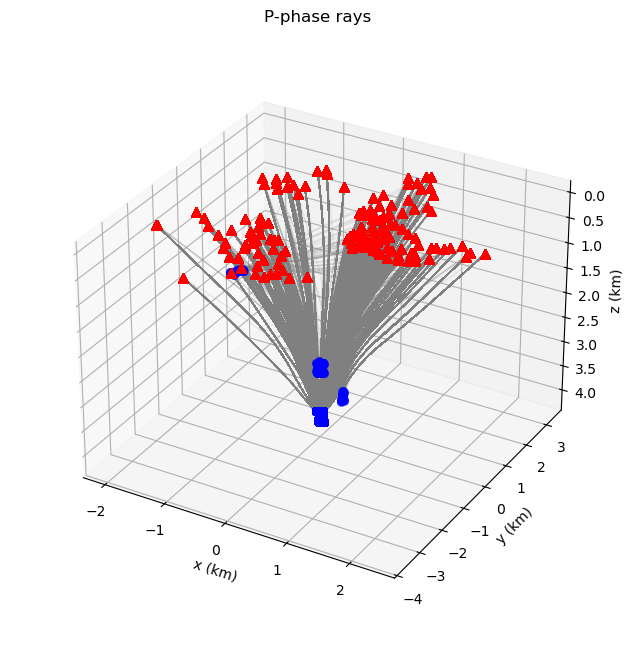

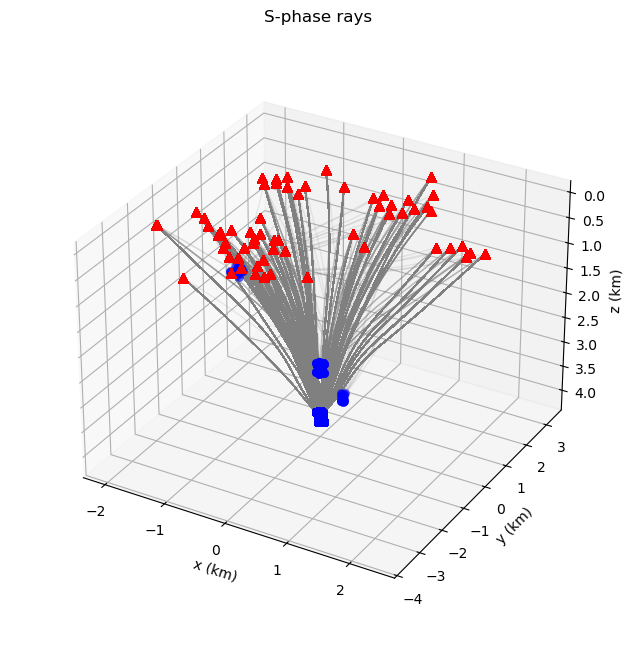

(<Figure size 1000x800 with 1 Axes>,
 <Axes3D: title={'center': 'S-phase rays'}, xlabel='x (km)', ylabel='y (km)', zlabel='z (km)'>)

In [9]:
# New plotting helper - same colour and flipped z-axis
def modified_plot_rays_collection(rays_saved, show=True, title=None, color='grey', alpha=0.5):
    fig = plt.figure(figsize=(10,8))
    ax = fig.add_subplot(111, projection="3d")

    for rec in rays_saved:
        ray = rec["ray"]
        ax.plot(ray[:,0], ray[:,1], ray[:,2], color=color, alpha=alpha, linewidth=1.0)
        ax.scatter([ray[0,0]], [ray[0,1]], [ray[0,2]], marker="o", s=30, color='blue', alpha=0.5)   # receiver (start)
        ax.scatter([ray[-1,0]], [ray[-1,1]], [ray[-1,2]], marker="^", s=40, color='red',alpha=0.5) # source (end)

    ax.set_xlabel("x (km)"); ax.set_ylabel("y (km)"); ax.set_zlabel("z (km)")
    ax.invert_zaxis()

    if title:
        ax.set_title(title)
    ax.set_box_aspect(None, zoom=0.9)
    if show:
        plt.show()
    return fig, ax

modified_plot_rays_collection(p_rays, title="P-phase rays", color='grey', alpha=0.15)
modified_plot_rays_collection(s_rays, title="S-phase rays", color='grey', alpha=0.15)

In [ ]:
import numpy as np
import scipy.sparse as sp
from collections import defaultdict
from tqdm import tqdm  # optional progress bar; install with `pip install tqdm`


def _cell_index_from_point(pt, min_coords, intervals, ncx, ncy, ncz):
    """
    Return (ix,iy,iz) cell index for point pt. If point lies on the max boundary,
    clip to the last cell. Returns None if point outside domain.
    """
    rel = (pt - min_coords) / intervals
    ix = int(np.floor(rel[0]))
    iy = int(np.floor(rel[1]))
    iz = int(np.floor(rel[2]))
    if ix < 0 or ix >= ncx or iy < 0 or iy >= ncy or iz < 0 or iz >= ncz:
        return None
    return ix, iy, iz


def build_G_from_rays(rays_saved, grid_params, subdivisions=20, verbose=False):
    """
    Build sparse sensitivity matrix G for slowness-per-cell from ray paths.

    Args
    ----
    rays_saved : list of dicts
        Each dict contains at least "ray" (an Nx3 array) and optionally "phase","src","rec".
        The ordering of rays_saved defines observation index i (0..Nobs-1).
    grid_params : dict
        dict with keys: min_coords (tuple), node_intervals (tuple), npts (tuple)
        (same as used for building your solver). We interpret model cells = npts - 1.
    subdivisions : int
        Number of sub-samples per ray segment used to approximate segment-cell lengths.
        Increase for higher accuracy (cost ∝ subdivisions).
    Returns
    -------
    G : scipy.sparse.csr_matrix shape (Nobs, M)
        Sensitivity matrix where G[i,j] = path length of ray i inside cell j.
        Cell indexing uses j = ix + iy*ncx + iz*ncx*ncy (0-based).
    meta : dict
        metadata: {'Nobs', 'ncx','ncy','ncz','M','min_coords','intervals'}
    """
    min_coords = np.asarray(grid_params["min_coords"], dtype=float)
    intervals = np.asarray(grid_params["node_intervals"], dtype=float)
    npts = np.asarray(grid_params["npts"], dtype=int)
    nx, ny, nz = npts
    ncx, ncy, ncz = nx - 1, ny - 1, nz - 1
    if ncx <= 0 or ncy <= 0 or ncz <= 0:
        raise ValueError("npts must be at least 2 in each dimension to form cells")

    Nobs = len(rays_saved)
    M = ncx * ncy * ncz

    # accumulate triples lists
    row_idx = []
    col_idx = []
    data_vals = []

    it = enumerate(rays_saved)
    if verbose:
        it = tqdm(it, total=Nobs, desc="Building G")

    for i, rec in it:
        ray = np.asarray(rec["ray"], dtype=float)
        if ray.shape[0] < 2:
            # degenerate
            continue

        # For each consecutive segment, subdivide and assign samples to cells
        for a, b in zip(ray[:-1], ray[1:]):
            seg_vec = b - a
            seg_len = np.linalg.norm(seg_vec)
            if seg_len == 0:
                continue
            # sample subdivided points including left endpoint, exclude exact right endpoint
            t = np.linspace(0.0, 1.0, subdivisions, endpoint=False)
            sample_pts = a[None, :] + np.outer(t, seg_vec)  # shape (subdivisions, 3)
            # length contribution per sample
            contrib = seg_len / subdivisions
            # accumulate per cell for this segment
            counts = defaultdict(int)
            for pt in sample_pts:
                idx = _cell_index_from_point(pt, min_coords, intervals, ncx, ncy, ncz)
                if idx is None:
                    # sample outside domain -> ignore or optionally clip
                    continue
                ix, iy, iz = idx
                j = ix + iy * ncx + iz * (ncx * ncy)  # 0-based j
                counts[j] += 1
            # convert counts -> (i,j,val)
            for j, cnt in counts.items():
                row_idx.append(i)
                col_idx.append(j)
                data_vals.append(cnt * contrib)

    # build COO then convert to CSR (this will sum duplicate (i,j) entries automatically)
    if len(data_vals) == 0:
        G = sp.csr_matrix((Nobs, M), dtype=float)
    else:
        G = sp.coo_matrix((data_vals, (row_idx, col_idx)), shape=(Nobs, M)).tocsr()

    meta = {"Nobs": Nobs, "ncx": ncx, "ncy": ncy, "ncz": ncz, "M": M,
            "min_coords": min_coords.tolist(), "intervals": intervals.tolist()}

    return G, meta


def write_G_text(filename, G, one_based=True, float_fmt="{:.6e}"):
    """
    Write sparse G to text format:

    Header1: int number_of_nonzero_entries
    Header2: int N M
    Then rows: i j Gij

    Uses 1-based indexing by default (i,j start at 1). Set one_based=False for 0-based.
    """
    if not sp.isspmatrix_csr(G):
        G = G.tocsr()
    G_coo = G.tocoo()
    nnz = G_coo.nnz
    N, M = G.shape

    offset = 1 if one_based else 0
    with open(filename, "w") as f:
        f.write(f"{nnz}\n")
        f.write(f"{N} {M}\n")
        for r, c, v in zip(G_coo.row, G_coo.col, G_coo.data):
            f.write(f"{r + offset} {c + offset} {float_fmt.format(v)}\n")


def read_G_text(filename, assume_one_based=True):
    """
    Read the text format written by write_G_text. Returns csr_matrix G.
    The reader will attempt to detect 1-based vs 0-based: if the max index equals N or M,
    it will subtract 1 (i.e., interpret as 1-based). If unsure, use assume_one_based flag.
    """
    with open(filename, "r") as f:
        first = f.readline().strip()
        if not first:
            raise ValueError("Empty file")
        nnz = int(first)
        second = f.readline().strip()
        N_str, M_str = second.split()
        N = int(N_str); M = int(M_str)
        rows = []
        cols = []
        vals = []
        for line in f:
            parts = line.strip().split()
            if len(parts) < 3:
                continue
            i = int(parts[0])
            j = int(parts[1])
            v = float(parts[2])
            rows.append(i)
            cols.append(j)
            vals.append(v)

    # detect one-based if requested/detected
    rows = np.array(rows, dtype=int)
    cols = np.array(cols, dtype=int)
    if len(rows) == 0:
        return sp.csr_matrix((N, M), dtype=float)

    # If values appear to be 1-based (max index == N or M) then convert to 0-based
    if assume_one_based:
        rows0 = rows - 1
        cols0 = cols - 1
    else:
        # attempt to auto-detect: if max(rows) == N then probably 1-based
        if rows.max() == N or cols.max() == M:
            rows0 = rows - 1
            cols0 = cols - 1
        else:
            rows0 = rows
            cols0 = cols

    G = sp.coo_matrix((vals, (rows0, cols0)), shape=(N, M)).tocsr()
    return G

In [ ]:
# Building G matrix from saved rays

grid_params = {
    "min_coords": (0.0, 0.0, 0.0),
    "node_intervals": (1.0, 1.0, 1.0),
    "npts": (10, 10, 10)
}

G_p, meta_p = build_G_from_rays(p_rays, grid_params, subdivisions=20, verbose=False)
G_s, meta_s = build_G_from_rays(s_rays, grid_params, subdivisions=20, verbose=False)

# Write G matrix into text format
write_G_text("G_matrix_p_rays.txt", G_p, one_based=True, float_fmt="{:.6e}")
write_G_text("G_matrix_s_rays.txt", G_s, one_based=True, float_fmt="{:.6e}")

# Relevant information
print("P-wave G matrix:")
print(f"Shape: {G_p.shape}")
print(f"Observations: {meta_p['Nobs']}")
print(f"Cells: {meta_p['M']}")
print(f"Non-zeroes: {G_p.nnz}")

print("\nS-wave G matrix:")
print(f"Shape: {G_s.shape}")
print(f"Observations: {meta_s['Nobs']}")
print(f"Cells: {meta_s['M']}")
print(f"Non-zeroes: {G_s.nnz}")

P-wave G matrix:
Shape: (23989, 729)
Observations: 23989
Cells: 729
Non-zeroes: 52984

S-wave G matrix:
Shape: (12696, 729)
Observations: 12696
Cells: 729
Non-zeroes: 26848


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# try to import gaussian_filter for smoothing; fallback to no smoothing
try:
    from scipy.ndimage import gaussian_filter
    _HAS_GAUSSIAN = True
except Exception:
    _HAS_GAUSSIAN = False

def rays_to_points(rays_saved):
    """
    Given rays_saved list (dicts with key 'ray' each an (N,3) array),
    return an (M,3) array of all points concatenated (x,y,z).
    """
    pts = []
    for rec in rays_saved:
        ray = rec.get("ray")
        if ray is None:
            continue
        ray = np.asarray(ray, dtype=float)
        if ray.size == 0:
            continue
        # ensure shape (N,3)
        if ray.ndim == 1 and ray.size == 3:
            ray = ray.reshape(1,3)
        pts.append(ray)
    if len(pts) == 0:
        return np.empty((0,3))
    return np.vstack(pts)


def compute_density_map(points, x_edges, y_edges, zmin, zmax):
    """
    Compute 2D histogram of points whose z is in [zmin, zmax).
    points: (N,3) array in km: columns x,y,z
    x_edges,y_edges: 1D arrays of bin edges
    returns: density 2D array shape (len(y_edges)-1, len(x_edges)-1)
    """
    if points.size == 0:
        return np.zeros((len(y_edges)-1, len(x_edges)-1), dtype=float)
    sel = (points[:,2] >= zmin) & (points[:,2] < zmax)
    if not np.any(sel):
        return np.zeros((len(y_edges)-1, len(x_edges)-1), dtype=float)
    pts_sel = points[sel]
    H, xedges, yedges = np.histogram2d(pts_sel[:,1], pts_sel[:,0],  # note np.histogram2d uses x=first axis; we use (y,x) so swap
                                       bins=[y_edges, x_edges])
    # H shape: (len(y_edges)-1, len(x_edges)-1)
    return H


def make_depth_slices(zmin, zmax, n_slices=None, slice_thickness=None, overlap=0.0):
    """
    Build list of (z0,z1) pairs covering [zmin,zmax].
    Either n_slices or slice_thickness must be provided.
    overlap: fraction of slice_thickness to overlap (0..<1)
    """
    if n_slices is None and slice_thickness is None:
        raise ValueError("provide n_slices or slice_thickness")
    if n_slices is not None:
        depths = np.linspace(zmin, zmax, n_slices+1)
        slices = [(depths[i], depths[i+1]) for i in range(len(depths)-1)]
    else:
        t = float(slice_thickness)
        if t <= 0:
            raise ValueError("slice_thickness must be > 0")
        step = t * (1.0 - overlap)
        zs = np.arange(zmin, zmax, step)
        slices = [(z, min(z+t, zmax)) for z in zs]
    return slices


def plot_ray_density_slices(p_rays, s_rays,
                            xlim=None, ylim=None, zmin=None, zmax=None,
                            n_slices=6, bins=100, slice_thickness=None, overlap=0.0,
                            smoothing_sigma=1.0, cmap='viridis',
                            station_coords=None, source_coords=None,
                            figsize=(14, 8), vmin_vmax=None):
    """
    Compute and plot ray density slices for P and S rays side-by-side.

    p_rays, s_rays: lists of ray dicts returned by trace_phase_rays
    xlim, ylim: (xmin, xmax), (ymin, ymax) in same units as rays (km). If None, auto from rays.
    zmin, zmax: min and max depth (km) to slice over. If None, auto from rays.
    n_slices: number of depth slices (ignored if slice_thickness provided).
    bins: number of bins in x and y (int) or tuple (nx, ny)
    smoothing_sigma: Gaussian sigma in pixels for smoothing (requires scipy), set 0 for none.
    vmin_vmax: tuple (vmin, vmax) to fix color scale across all panels. If None, computed from P+S data.
    station_coords/source_coords: dict name->(x,y,z) (km); will plot station/source markers on each slice.
    """
    # points arrays
    p_pts = rays_to_points(p_rays)
    s_pts = rays_to_points(s_rays)

    # auto extents
    all_pts = np.vstack([p_pts, s_pts]) if p_pts.size and s_pts.size else (p_pts if p_pts.size else s_pts)
    if all_pts.size == 0:
        raise RuntimeError("No ray points found in either P or S rays.")
    xs = all_pts[:,0]; ys = all_pts[:,1]; zs = all_pts[:,2]
    if xlim is None:
        xmin, xmax = float(xs.min()), float(xs.max())
        padx = 0.02 * (xmax - xmin) if xmax>xmin else 0.1
        xlim = (xmin - padx, xmax + padx)
    if ylim is None:
        ymin, ymax = float(ys.min()), float(ys.max())
        pady = 0.02 * (ymax - ymin) if ymax>ymin else 0.1
        ylim = (ymin - pady, ymax + pady)
    if zmin is None:
        zmin = float(zs.min())
    if zmax is None:
        zmax = float(zs.max())

    # bins
    if isinstance(bins, int):
        nx = bins; ny = bins
    else:
        nx, ny = bins
    x_edges = np.linspace(xlim[0], xlim[1], nx+1)
    y_edges = np.linspace(ylim[0], ylim[1], ny+1)

    # depth slices
    slices = make_depth_slices(zmin, zmax, n_slices=n_slices, slice_thickness=slice_thickness, overlap=overlap)

    # compute maps
    p_maps = []
    s_maps = []
    for (z0,z1) in slices:
        pH = compute_density_map(p_pts, x_edges, y_edges, z0, z1)
        sH = compute_density_map(s_pts, x_edges, y_edges, z0, z1)
        if smoothing_sigma and smoothing_sigma > 0 and _HAS_GAUSSIAN:
            pH = gaussian_filter(pH, sigma=smoothing_sigma)
            sH = gaussian_filter(sH, sigma=smoothing_sigma)
        p_maps.append(pH)
        s_maps.append(sH)

    # color scale
    if vmin_vmax is None:
        global_max = max([m.max() for m in (p_maps + s_maps)]) if (p_maps + s_maps) else 1.0
        vmin, vmax = 0.0, global_max
    else:
        vmin, vmax = vmin_vmax

    # plotting grid: rows = slices, cols = [P, S]
    n = len(slices)
    fig, axes = plt.subplots(nrows=n, ncols=2, figsize=figsize, constrained_layout=True,
                             sharex=True, sharey=True)
    if n == 1:
        axes = axes.reshape(1,2)

    extent = (x_edges[0], x_edges[-1], y_edges[0], y_edges[-1])  # left,right,bottom,top

    for i, (z0,z1) in enumerate(slices):
        # P
        axp = axes[i,0]
        im_p = axp.imshow(np.flipud(p_maps[i]), extent=extent, vmin=vmin, vmax=vmax, aspect='auto', cmap=cmap)
        axp.set_title(f"P density {z0:.2f}–{z1:.2f} km")
        # S
        axs = axes[i,1]
        im_s = axs.imshow(np.flipud(s_maps[i]), extent=extent, vmin=vmin, vmax=vmax, aspect='auto', cmap=cmap)
        axs.set_title(f"S density {z0:.2f}–{z1:.2f} km")

        # overlay station/source markers if provided
        if station_coords:
            sx = [c[0] for c in station_coords.values()]
            sy = [c[1] for c in station_coords.values()]
            axp.scatter(sx, sy, marker='v', s=8, edgecolor='k', linewidth=0.3)
            axs.scatter(sx, sy, marker='v', s=8, edgecolor='k', linewidth=0.3)
        if source_coords:
            sx = [c[0] for c in source_coords.values()]
            sy = [c[1] for c in source_coords.values()]
            axp.scatter(sx, sy, marker='*', s=12, edgecolor='k', linewidth=0.3)
            axs.scatter(sx, sy, marker='*', s=12, edgecolor='k', linewidth=0.3)

        axp.set_xlim(xlim); axp.set_ylim(ylim)
        axs.set_xlim(xlim); axs.set_ylim(ylim)

    # single colorbar on the right
    cbar = fig.colorbar(im_s, ax=axes.ravel().tolist(), fraction=0.015, pad=0.02)
    cbar.set_label("ray hits (counts)")

    plt.suptitle("Ray density slices (columns: P | S)", fontsize=14)
    plt.show()
    return fig, axes

# Convert station/source coords from your loaders to km (they already are in your loaders)
# station_coords: dict name->(x,y,z) in km, source_coords likewise

# quick conversion if your load_station_coords_csv returned meters patched earlier:
# station_coords_km = {k: v/1000.0 for k,v in station_coords.items()}

# Plot 6 slices between min and max depths automatically:
"""
fig, axes = plot_ray_density_slices(p_rays, s_rays,
                                    n_slices=6,
                                    bins=200,
                                    smoothing_sigma=1.0,
                                    station_coords=station_coords,
                                    source_coords=source_coords,
                                    figsize=(12, 14))
"""

'\nfig, axes = plot_ray_density_slices(p_rays, s_rays,\n                                    n_slices=6,\n                                    bins=200,\n                                    smoothing_sigma=1.0,\n                                    station_coords=station_coords,\n                                    source_coords=source_coords,\n                                    figsize=(12, 14))\n'

Station coords type: <class 'dict'>
Source coords type: <class 'dict'>
Example station: ('A101T', array([-0.78031815,  2.35852461,  0.17549   ]))
Example source: ('1', array([-0.13402 ,  0.233324,  4.007   ]))

P-rays: 23989 rays
S-rays: 12696 rays
First P-ray keys: dict_keys(['src', 'rec', 'phase', 'file', 'ray'])
First P-ray shape: (17, 3)

Ray coordinate ranges:
  X: [-2.04, 2.38] km
  Y: [-3.61, 3.25] km
  Z: [0.07, 4.12] km


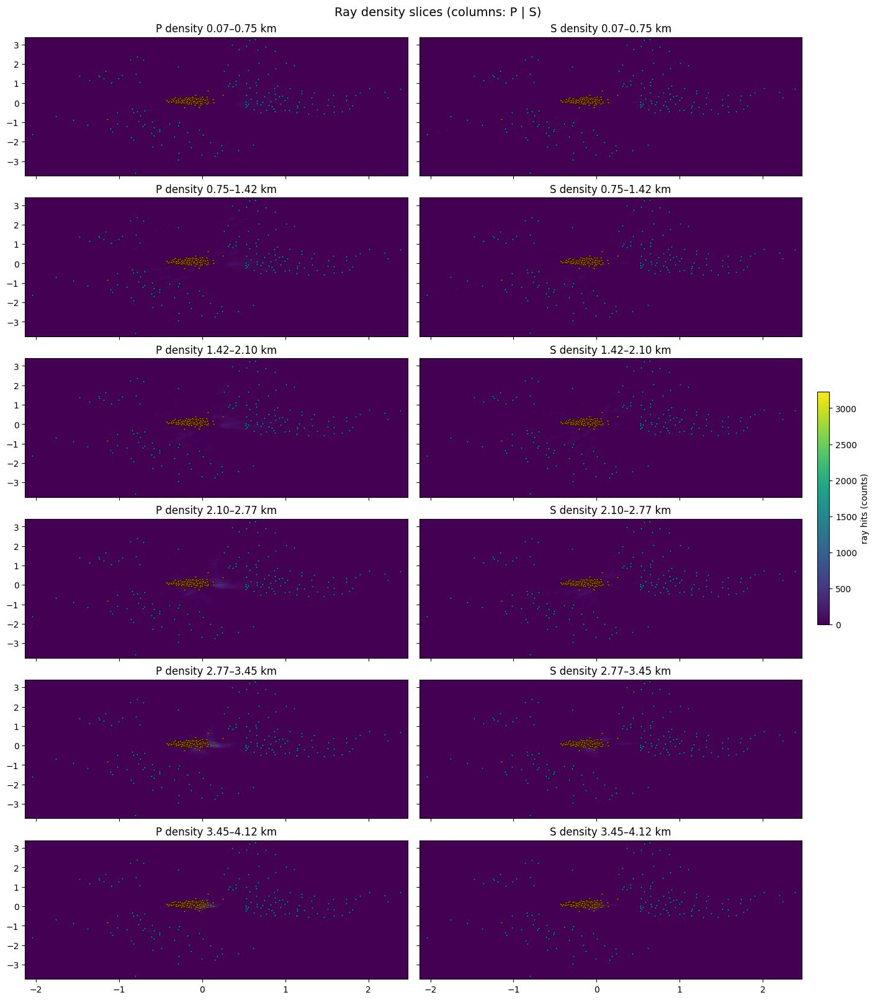


✓ Ray density plot complete!


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# ========================================
# STEP 1: Prepare station_coords and source_coords
# ========================================
# The function expects dictionaries: name -> (x, y, z) in km

# If you loaded from CSV files, convert to the right format:
# Assuming you have station_coords and source_coords loaded earlier

# Convert station coordinates to dictionary format (if not already)
# If your station_coords is already a dict, skip this
if isinstance(station_coords, np.ndarray):
    # If it's an array, create a simple dict with indices as keys
    station_coords_dict = {f"sta_{i}": coord for i, coord in enumerate(station_coords)}
else:
    # Already a dict, just use it
    station_coords_dict = station_coords

# Convert source coordinates to dictionary format (if not already)
if isinstance(source_coords, np.ndarray):
    source_coords_dict = {f"src_{i}": coord for i, coord in enumerate(source_coords)}
else:
    source_coords_dict = source_coords

print(f"Station coords type: {type(station_coords_dict)}")
print(f"Source coords type: {type(source_coords_dict)}")
print(f"Example station: {list(station_coords_dict.items())[0] if station_coords_dict else 'None'}")
print(f"Example source: {list(source_coords_dict.items())[0] if source_coords_dict else 'None'}")

# ========================================
# STEP 2: Check that p_rays and s_rays are in correct format
# ========================================
# Should be list of dicts with 'ray' key

print(f"\nP-rays: {len(p_rays)} rays")
print(f"S-rays: {len(s_rays)} rays")

# Check format
if len(p_rays) > 0:
    print(f"First P-ray keys: {p_rays[0].keys()}")
    print(f"First P-ray shape: {p_rays[0]['ray'].shape}")

# ========================================
# STEP 3: Determine coordinate ranges for your data
# ========================================
# Extract all ray points to see the extent
from scipy.ndimage import gaussian_filter  # Import needed for smoothing

def rays_to_points(rays_saved):
    pts = []
    for rec in rays_saved:
        ray = rec.get("ray")
        if ray is None:
            continue
        ray = np.asarray(ray, dtype=float)
        if ray.size == 0:
            continue
        if ray.ndim == 1 and ray.size == 3:
            ray = ray.reshape(1,3)
        pts.append(ray)
    if len(pts) == 0:
        return np.empty((0,3))
    return np.vstack(pts)

p_pts = rays_to_points(p_rays)
s_pts = rays_to_points(s_rays)

if p_pts.size > 0 and s_pts.size > 0:
    all_pts = np.vstack([p_pts, s_pts])
elif p_pts.size > 0:
    all_pts = p_pts
else:
    all_pts = s_pts

if all_pts.size > 0:
    print(f"\nRay coordinate ranges:")
    print(f"  X: [{all_pts[:,0].min():.2f}, {all_pts[:,0].max():.2f}] km")
    print(f"  Y: [{all_pts[:,1].min():.2f}, {all_pts[:,1].max():.2f}] km")
    print(f"  Z: [{all_pts[:,2].min():.2f}, {all_pts[:,2].max():.2f}] km")

# ========================================
# STEP 4: Plot ray density slices
# ========================================

# OPTION A: Let function auto-detect ranges
fig, axes = plot_ray_density_slices(
    p_rays,
    s_rays,
    n_slices=6,                      # 6 depth slices
    bins=200,                        # 200x200 bins for resolution
    smoothing_sigma=1.0,             # Smooth the density maps
    station_coords=station_coords_dict,  # Use dict format
    source_coords=source_coords_dict,    # Use dict format
    figsize=(14, 16)                 # Figure size
)

# OPTION B: Specify ranges manually (if auto-detect doesn't work well)
# Adjust these values based on your actual data extent
"""
fig, axes = plot_ray_density_slices(
    p_rays,
    s_rays,
    xlim=(-2.5, 3.5),                # X range in km
    ylim=(-4.0, 4.0),                # Y range in km
    zmin=-9.0,                       # Min depth in km
    zmax=2.0,                        # Max depth in km
    n_slices=6,
    bins=200,
    smoothing_sigma=1.0,
    station_coords=station_coords_dict,
    source_coords=source_coords_dict,
    figsize=(14, 16)
)
"""

print("\n✓ Ray density plot complete!")

# ========================================
# OPTIONAL: Save the figure
# ========================================
# fig.savefig('ray_density_slices.png', dpi=300, bbox_inches='tight')
# print("✓ Figure saved!")

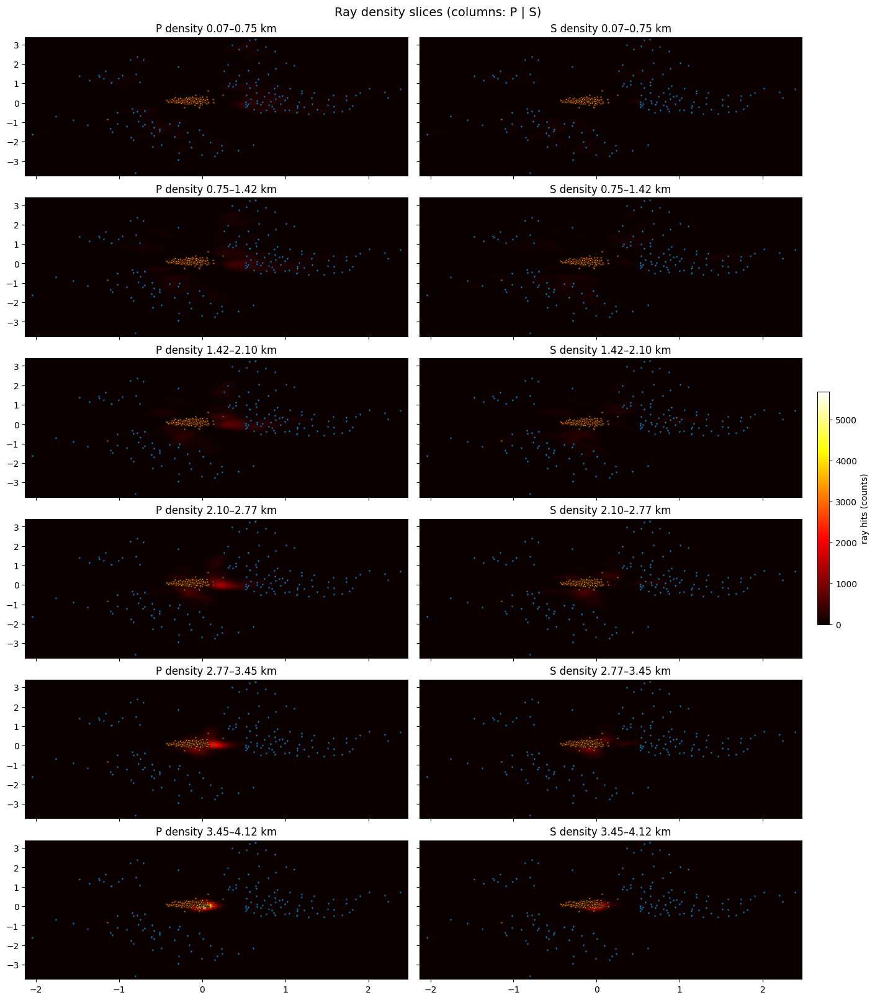

In [ ]:
# QUICKEST FIX: Log scale + better colormap
fig, axes = plot_ray_density_slices(
    p_rays, s_rays,
    n_slices=6,
    bins=80,               # Fewer bins
    smoothing_sigma=1.0,   # More smoothing
    station_coords=station_coords_dict,
    source_coords=source_coords_dict,
    cmap='hot',            # Better colormap
    figsize=(14, 16)
)

# Add log scale
for ax in axes.ravel():
    for im in ax.get_images():
        im.set_norm(plt.matplotlib.colors.LogNorm(vmin=1, vmax=im.get_array().max()))